# Notes



## Robinhood Data
### Database

- each timestamp reflects the amount of users currently holding that particular stock

### Monthly Users

**Source:** https://www.statista.com/statistics/822176/number-of-users-robinhood/

- Comparing figures on Statista with data on Robinhood's website it emerges that the number of active users refers to Dec 31  
- Smoothing to avoid sudden jumps

# Section 1

##  Robinhood Dataframe

In [1]:
%load_ext autoreload
%autoreload 2

In [ ]:

from src import DataLoader
import warnings
warnings.simplefilter(action='ignore', category=Warning)

import pandas as pd


dl = DataLoader(load_other_dfs=True)

dl.df_rh

2025-04-28 22:20:49,931 - src.data_loader - INFO - Robinhood data loaded (data_loader.py:129)


### Visualization

#### Distributuions

#### Number of Stocks

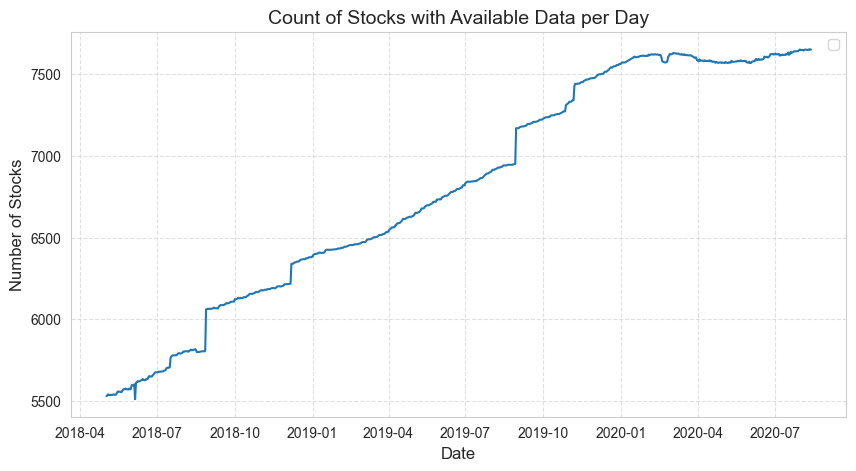

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("whitegrid")

plt.figure(figsize=(10, 5))  # Set figure size
sns.lineplot(x=dl.df_rh.index, y='num_stocks', data=dl.df_rh)

# Formatting
plt.xlabel('Date', fontsize=12)
plt.ylabel('Number of Stocks', fontsize=12)
plt.title('Count of Stocks with Available Data per Day', fontsize=14)
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid
plt.legend([], [], frameon=False) # Suppress legend
plt.legend()

# Show the plot
plt.show()

#### Number of Active Positions

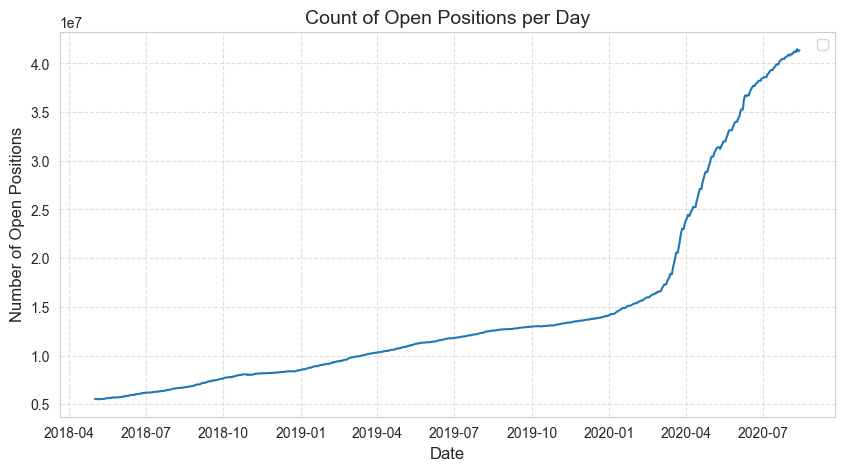

In [4]:
sns.set_style("whitegrid")

plt.figure(figsize=(10, 5))  # Set figure size
sns.lineplot(x=dl.df_rh.index, y='sum', data=dl.df_rh)

# Formatting
plt.xlabel('Date', fontsize=12)
plt.ylabel('Number of Open Positions', fontsize=12)
plt.title('Count of Open Positions per Day', fontsize=14)
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid
plt.legend([], [], frameon=False) # Suppress legend
plt.legend()

# Show the plot
plt.show()

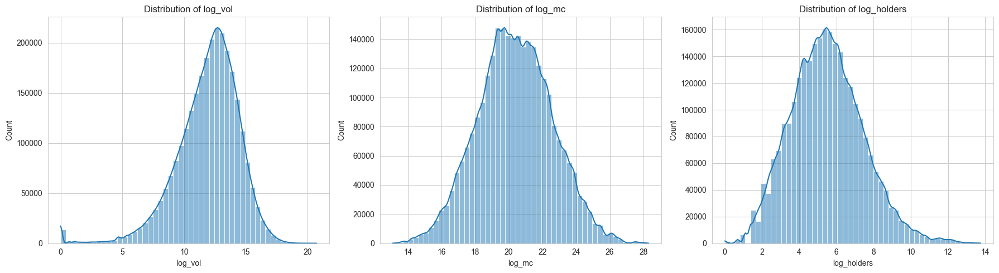

In [ ]:
dl = DataLoader(handle_nans="drop")
df_merged = dl.merge_dfs()

import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Define features to plot
features = ["vol", "mc", "holders"]
df_desc = df_merged[features+["ticker"]]
# Compute median per ticker
df = df_desc.groupby("ticker").median()

# Apply log transformation
for feature in features:
    df_desc[f"log_{feature}"] = np.log1p(df_desc[feature])

# Set Seaborn style
sns.set_style("whitegrid")

# Create a single row of 3 histograms
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 1 row, 3 columns

for n, feature in enumerate(features):
    sns.histplot(df_desc[f"log_{feature}"], bins=50, kde=True, ax=axes[n])
    axes[n].set_title(f"Distribution of log_{feature}")

# Adjust layout
plt.tight_layout()
plt.show()


## Market Data

### Merged Dataframe with CRSP Data

In [6]:
from src import DataLoader

dl = DataLoader(handle_nans="zero", load_other_dfs=True, load_merged=False)

df_merged = dl.merge_dfs()

df_merged

2025-04-17 15:21:35,727 - src.data_loader - DEBUG - self.df_robinhood_path: D:\Uni\Bocconi\Thesis\Robinhood_data\data\df_rh_last.parquet (data_loader.py:60)
DEBUG:src.data_loader:self.df_robinhood_path: D:\Uni\Bocconi\Thesis\Robinhood_data\data\df_rh_last.parquet
2025-04-17 15:21:35,728 - src.data_loader - DEBUG - self.df_wrds_path: D:\Uni\Bocconi\Thesis\Robinhood_data\data\df_wrds.parquet (data_loader.py:61)
DEBUG:src.data_loader:self.df_wrds_path: D:\Uni\Bocconi\Thesis\Robinhood_data\data\df_wrds.parquet
2025-04-17 15:21:35,728 - src.data_loader - DEBUG - self.df_crsp_path: D:\Uni\Bocconi\Thesis\Robinhood_data\data\df_crsp_div.parquet (data_loader.py:62)
DEBUG:src.data_loader:self.df_crsp_path: D:\Uni\Bocconi\Thesis\Robinhood_data\data\df_crsp_div.parquet
2025-04-17 15:21:35,730 - src.data_loader - DEBUG - self.df_merged_path: D:\Uni\Bocconi\Thesis\Robinhood_data\data\df_merged_zero.parquet (data_loader.py:63)
DEBUG:src.data_loader:self.df_merged_path: D:\Uni\Bocconi\Thesis\Robinhood

,date,ticker,holders,permno,shrcd,divamt,prc,vol,ret,shrout,...,prc_adj_div,log_returns,mc,market_weight,holders_change_pct,holders_change_diff,total_holders,popularity,total_holders_change_pct,total_holders_change_diff
0,2018-05-02,A,590.0,87432,11.0,0.0,65.91,2240482.0,-0.004982,322477.0,...,65.91,-0.004994,2.125446e+10,0.000630,NaN,NaN,5471535.0,0.000108,NaN,NaN
1,2018-05-03,A,587.0,87432,11.0,0.0,66.34,2365851.0,0.006524,322477.0,...,66.34,0.006503,2.139312e+10,0.000635,-0.005098,-3.0,5493613.0,0.000107,0.004035,22078.0
2,2018-05-04,A,588.0,87432,11.0,0.0,67.00,1331017.0,0.009949,322477.0,...,67.00,0.009900,2.160596e+10,0.000634,0.001702,1.0,5472047.0,0.000107,-0.003926,-21566.0
3,2018-05-07,A,576.0,87432,11.0,0.0,67.39,1468735.0,0.005821,322477.0,...,67.39,0.005804,2.173173e+10,0.000635,-0.020619,-12.0,5456655.0,0.000106,-0.002813,-15392.0
4,2018-05-08,A,580.0,87432,11.0,0.0,67.37,1916103.0,-0.000297,322477.0,...,67.37,-0.000297,2.172528e+10,0.000634,0.006920,4.0,5464041.0,0.000106,0.001354,7386.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3771652,2020-08-07,ZYXI,3192.0,18418,11.0,0.0,17.04,681368.0,0.013080,34706.0,...,17.04,0.012995,5.913902e+08,0.000014,-0.002816,-9.0,40476834.0,0.000079,0.003648,147136.0
3771653,2020-08-10,ZYXI,3178.0,18418,11.0,0.0,18.09,914091.0,0.061620,34706.0,...,18.09,0.059796,6.278315e+08,0.000015,-0.004396,-14.0,40693384.0,0.000078,0.005350,216550.0
3771654,2020-08-11,ZYXI,3150.0,18418,11.0,0.0,17.95,593295.0,-0.007739,34706.0,...,17.95,-0.007769,6.229727e+08,0.000015,-0.008850,-28.0,40555154.0,0.000078,-0.003397,-138230.0
3771655,2020-08-12,ZYXI,3147.0,18418,11.0,0.0,18.05,591079.0,0.005571,34706.0,...,18.05,0.005556,6.264433e+08,0.000015,-0.000953,-3.0,40523912.0,0.000078,-0.000770,-31242.0


### Open Positions

In [7]:
df_daily = df_merged[["date", "holders"]]
df_daily = df_daily.groupby("date").sum()
df_daily

,holders
date,
2018-05-02,5471535.0
2018-05-03,5493613.0
2018-05-04,5472047.0
2018-05-07,5456655.0
2018-05-08,5464041.0
...,...
2020-08-07,40476834.0
2020-08-10,40693384.0
2020-08-11,40555154.0


In [8]:
df_plot = dl.df_rh.loc[df_daily.index]
df_plot

,A,AACG,AAL,AAME,AAN,AAOI,AAON,AAP,AAPL,AAT,...,ZSAN,ZSL,ZTO,ZTR,ZTS,ZUMZ,ZUO,ZYNE,sum,num_stocks
date,,,,,,,,,,,,,,,,,,,,,
2018-05-02,590.000000,55.000000,3755.000000,119.000000,110.000000,2711.000000,71.000000,302.000000,150785.000000,46.000000,...,1878.000000,10.000000,433.000000,233.000000,588.000000,248.000000,539.000000,6127.000000,5.259222e+06,5222
2018-05-03,586.473684,55.473684,3778.368421,118.315789,109.000000,2714.105263,71.210526,295.368421,144779.052632,47.578947,...,1838.947368,12.000000,430.947368,232.842105,610.421053,250.052632,544.423077,6137.052632,5.268391e+06,5222
2018-05-04,587.458333,55.458333,3762.750000,119.000000,107.916667,2711.458333,73.750000,291.708333,142690.875000,47.000000,...,1807.583333,12.000000,428.916667,231.625000,608.083333,249.166667,547.739130,6145.416667,5.265924e+06,5222
2018-05-07,585.900000,56.571429,3759.050000,118.750000,109.200000,2722.200000,78.450000,289.300000,141437.200000,47.000000,...,1782.000000,12.100000,428.047619,230.200000,606.500000,245.950000,558.857143,6137.800000,5.255718e+06,5222
2018-05-08,577.125000,58.333333,3799.208333,118.416667,110.583333,2746.125000,83.750000,290.083333,141068.791667,47.166667,...,1765.208333,13.000000,428.541667,231.166667,605.833333,240.875000,592.333333,6141.916667,5.262235e+06,5222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-08-07,1614.125000,1658.625000,643510.125000,260.083333,1074.500000,1674.125000,279.541667,697.416667,676672.666667,145.750000,...,7955.333333,277.875000,2178.291667,841.166667,2742.500000,495.541667,6206.666667,32151.291667,3.257417e+07,5222
2020-08-10,1619.208333,1658.791667,640821.833333,259.333333,1075.500000,1678.625000,274.375000,705.208333,688717.500000,146.833333,...,8482.458333,306.541667,2187.666667,842.916667,2736.208333,498.041667,6224.458333,32060.833333,3.263787e+07,5222
2020-08-11,1625.500000,1647.458333,639770.583333,255.958333,1079.083333,1685.708333,271.333333,708.541667,701134.500000,145.791667,...,8510.250000,318.958333,2198.625000,845.708333,2732.416667,502.666667,6308.166667,31939.875000,3.267420e+07,5222


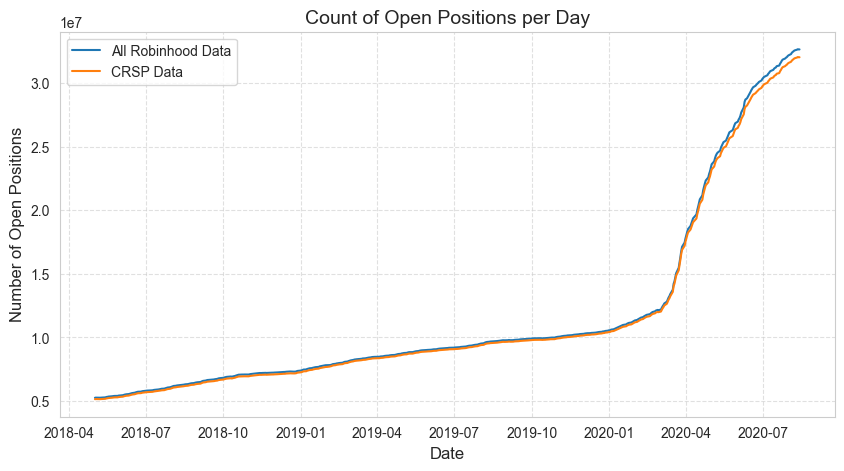

In [14]:
import matplotlib.ticker as mticker

sns.set_style("whitegrid")

plt.figure(figsize=(10, 5))  # Set figure size
sns.lineplot(x=df_plot.index, y='sum', data=df_plot, label="All Robinhood Data")
sns.lineplot(x=df_plot.index, y='holders', data=df_daily, label="CRSP Data")

# Formatting
plt.xlabel('Date', fontsize=12)
plt.ylabel('Number of Open Positions', fontsize=12)
plt.title('Count of Open Positions per Day', fontsize=14)
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid

plt.legend()

# Show the plot
plt.show()

#### Securities by Number

In [8]:
mapping = {
    11.0:"Stocks",
    12.0:"Stocks",
    73.0:"ETFs",
    31.0:"Funds",
    44.0:"Funds",
    48.0:"REITs"
}

In [10]:
shrcd_counts =df_merged["shrcd"].value_counts().sort_index()
shrcd_counts = pd.DataFrame(shrcd_counts)
shrcd_counts["classification"] = shrcd_counts.index.map(mapping).fillna("Other")

shrcd_counts = shrcd_counts.groupby("classification").sum() 
shrcd_counts /= shrcd_counts.sum()

shrcd_counts.round(3)*100

,count
classification,
ETFs,26.3
Funds,8.7
Other,7.2
REITs,0.5
Stocks,57.3


#### Securities by Market Cap

In [15]:
df_shrcd = df_merged[["shrcd", "mc"]]
df_shrcd.loc[:,"classification"] = df_shrcd["shrcd"].map(mapping)
df_shrcd["classification"] = df_shrcd["classification"].fillna("Other")
df_shrcd = df_shrcd[["mc","classification"]]
df_shrcd = df_shrcd.groupby("classification").sum()
df_shrcd = df_shrcd / df_shrcd.sum(axis=0) 
#df_shrcd = df_shrcd.set_index("classification", drop=True)

df_shrcd.round(3)*100

,mc
classification,
ETFs,9.4
Funds,3.3
Other,3.8
REITs,0.4
Stocks,83.1


### Retail Participation vs Market Cap

In [16]:
df_merged

,date,ticker,holders,permno,shrcd,divamt,prc,vol,ret,shrout,...,prc_adj_div,log_returns,mc,market_weight,holders_change_pct,holders_change_diff,total_holders,popularity,total_holders_change_pct,total_holders_change_diff
0,2018-05-02,A,590.0,87432,11.0,0.0,65.91,2240482.0,-0.004982,322477.0,...,65.91,-0.004994,2.125446e+10,0.000630,NaN,NaN,5471535.0,0.000108,NaN,NaN
1,2018-05-03,A,587.0,87432,11.0,0.0,66.34,2365851.0,0.006524,322477.0,...,66.34,0.006503,2.139312e+10,0.000635,-0.005098,-3.0,5493613.0,0.000107,0.004035,22078.0
2,2018-05-04,A,588.0,87432,11.0,0.0,67.00,1331017.0,0.009949,322477.0,...,67.00,0.009900,2.160596e+10,0.000634,0.001702,1.0,5472047.0,0.000107,-0.003926,-21566.0
3,2018-05-07,A,576.0,87432,11.0,0.0,67.39,1468735.0,0.005821,322477.0,...,67.39,0.005804,2.173173e+10,0.000635,-0.020619,-12.0,5456655.0,0.000106,-0.002813,-15392.0
4,2018-05-08,A,580.0,87432,11.0,0.0,67.37,1916103.0,-0.000297,322477.0,...,67.37,-0.000297,2.172528e+10,0.000634,0.006920,4.0,5464041.0,0.000106,0.001354,7386.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3771652,2020-08-07,ZYXI,3192.0,18418,11.0,0.0,17.04,681368.0,0.013080,34706.0,...,17.04,0.012995,5.913902e+08,0.000014,-0.002816,-9.0,40476834.0,0.000079,0.003648,147136.0
3771653,2020-08-10,ZYXI,3178.0,18418,11.0,0.0,18.09,914091.0,0.061620,34706.0,...,18.09,0.059796,6.278315e+08,0.000015,-0.004396,-14.0,40693384.0,0.000078,0.005350,216550.0
3771654,2020-08-11,ZYXI,3150.0,18418,11.0,0.0,17.95,593295.0,-0.007739,34706.0,...,17.95,-0.007769,6.229727e+08,0.000015,-0.008850,-28.0,40555154.0,0.000078,-0.003397,-138230.0
3771655,2020-08-12,ZYXI,3147.0,18418,11.0,0.0,18.05,591079.0,0.005571,34706.0,...,18.05,0.005556,6.264433e+08,0.000015,-0.000953,-3.0,40523912.0,0.000078,-0.000770,-31242.0


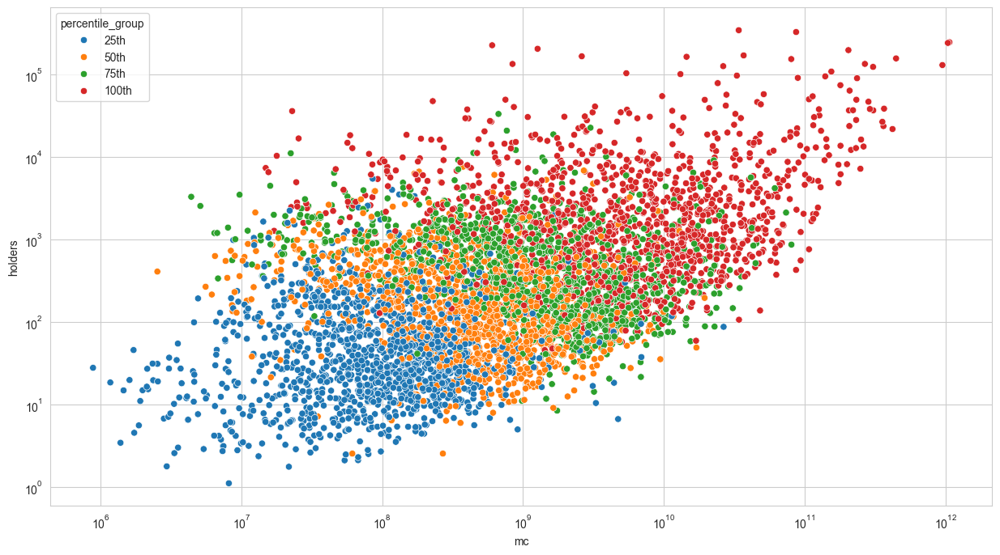

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("whitegrid")

df_scatter = df_merged[["mc", "holders", "ticker", "vol"]].groupby("ticker").mean()
percentile_bins = [0, 0.25, 0.50, 0.75, 1.0]  
percentile_labels = ["25th", "50th", "75th", "100th"]

df_scatter["percentile_group"] = pd.qcut(df_scatter["vol"], q=percentile_bins, labels=percentile_labels)


plt.figure(figsize=(15,8))

sns.scatterplot(data=df_scatter, x="mc", y="holders", hue="percentile_group")
plt.xscale("log")
plt.yscale("log")
plt.xticks(None)
plt.show()

## Comparing the Portfolios

### Distance Measures


In [17]:
from src import DataLoader

dl = DataLoader(handle_nans="zero")
df_merged = dl.merge_dfs()

2025-04-17 15:29:58,177 - src.data_loader - DEBUG - self.df_robinhood_path: D:\Uni\Bocconi\Thesis\Robinhood_data\data\df_rh_last.parquet (data_loader.py:60)
DEBUG:src.data_loader:self.df_robinhood_path: D:\Uni\Bocconi\Thesis\Robinhood_data\data\df_rh_last.parquet
2025-04-17 15:29:58,178 - src.data_loader - DEBUG - self.df_wrds_path: D:\Uni\Bocconi\Thesis\Robinhood_data\data\df_wrds.parquet (data_loader.py:61)
DEBUG:src.data_loader:self.df_wrds_path: D:\Uni\Bocconi\Thesis\Robinhood_data\data\df_wrds.parquet
2025-04-17 15:29:58,179 - src.data_loader - DEBUG - self.df_crsp_path: D:\Uni\Bocconi\Thesis\Robinhood_data\data\df_crsp_div.parquet (data_loader.py:62)
DEBUG:src.data_loader:self.df_crsp_path: D:\Uni\Bocconi\Thesis\Robinhood_data\data\df_crsp_div.parquet
2025-04-17 15:29:58,180 - src.data_loader - DEBUG - self.df_merged_path: D:\Uni\Bocconi\Thesis\Robinhood_data\data\df_merged_zero.parquet (data_loader.py:63)
DEBUG:src.data_loader:self.df_merged_path: D:\Uni\Bocconi\Thesis\Robinhood

In [19]:
df_top_n, df_rank = dl.compute_distances(n=50, df_merged=df_merged, by="popularity")


2025-04-17 16:07:52,307 - src.data_loader - DEBUG - load_merged:  True (data_loader.py:198)
DEBUG:src.data_loader:load_merged:  True


In [20]:
df_top_n

,date,ticker,mc,popularity,holders,prc_adj,shrcd,vol,rank_mkt,rank_popularity,rank_distance,m_daily,popularity_daily,m_daily_pct,popularity_daily_pct,popularity_pct_distance
0,2018-05-02,AAPL,8.678660e+11,0.027558,150785.0,176.57001,11.0,66541423.0,1.0,1.0,0.000000,3.373960e+13,3.373960e+13,0.025722,8.167874e-16,-2.100979e-17
1,2018-05-02,GE,1.231322e+11,0.024625,134735.0,14.18000,11.0,51678009.0,40.0,2.0,19.000000,3.373960e+13,3.373960e+13,0.003649,7.298461e-16,-2.663563e-18
2,2018-05-02,F,4.387708e+10,0.023955,131071.0,11.21000,11.0,41899467.0,147.0,3.0,48.000000,3.373960e+13,3.373960e+13,0.001300,7.099986e-16,-9.233266e-19
3,2018-05-02,AMD,1.063370e+10,0.023433,128212.0,10.97000,11.0,29089898.0,571.0,4.0,141.750000,3.373960e+13,3.373960e+13,0.000315,6.945117e-16,-2.188891e-19
4,2018-05-02,GPRO,5.574253e+08,0.020854,114106.0,4.97000,11.0,2494409.0,2987.0,5.0,596.400000,3.373960e+13,3.373960e+13,0.000017,6.181009e-16,-1.021189e-20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28195,2020-08-13,MGM,1.052527e+10,0.004381,177707.0,21.34000,11.0,13891894.0,667.0,46.0,13.500000,4.315688e+13,4.315688e+13,0.000244,1.015074e-16,-2.475602e-20
28196,2020-08-13,XOM,1.818554e+11,0.003997,162144.0,43.01000,11.0,17338689.0,32.0,47.0,-0.319149,4.315688e+13,4.315688e+13,0.004214,9.261769e-17,-3.902743e-19
28197,2020-08-13,NVDA,2.824132e+11,0.003892,157881.0,457.72000,11.0,9331779.0,18.0,48.0,-0.625000,4.315688e+13,4.315688e+13,0.006544,9.018264e-17,-5.901439e-19
28198,2020-08-13,SPCE,3.949283e+09,0.003860,156590.0,18.77000,11.0,15602673.0,1256.0,49.0,24.632653,4.315688e+13,4.315688e+13,0.000092,8.944521e-17,-8.185125e-21


In [21]:
df_rank

,date,ticker,mc,popularity,holders,prc_adj,shrcd,vol,rank_mkt,rank_popularity,rank_distance,m_daily,popularity_daily,m_daily_pct,popularity_daily_pct,popularity_pct_distance
6332,2018-05-02,AAPL,8.678660e+11,0.027558,150785.0,176.57001,11.0,66541423.0,1.0,1.0,0.000000,3.373960e+13,3.373960e+13,2.572247e-02,8.167874e-16,-2.100979e-17
1390680,2018-05-02,GE,1.231322e+11,0.024625,134735.0,14.18000,11.0,51678009.0,40.0,2.0,19.000000,3.373960e+13,3.373960e+13,3.649486e-03,7.298461e-16,-2.663563e-18
1135660,2018-05-02,F,4.387708e+10,0.023955,131071.0,11.21000,11.0,41899467.0,147.0,3.0,48.000000,3.373960e+13,3.373960e+13,1.300462e-03,7.099986e-16,-9.233266e-19
135067,2018-05-02,AMD,1.063370e+10,0.023433,128212.0,10.97000,11.0,29089898.0,571.0,4.0,141.750000,3.373960e+13,3.373960e+13,3.151698e-04,6.945117e-16,-2.188891e-19
1466512,2018-05-02,GPRO,5.574253e+08,0.020854,114106.0,4.97000,11.0,2494409.0,2987.0,5.0,596.400000,3.373960e+13,3.373960e+13,1.652140e-05,6.181009e-16,-1.021189e-20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3533378,2020-08-13,VHI,3.005101e+08,0.000000,0.0,10.63000,11.0,7384.0,3880.0,7092.5,-0.452943,4.315688e+13,4.315688e+13,6.963203e-06,0.000000e+00,-0.000000e+00
3542878,2020-08-13,VISL,3.607296e+07,0.000000,0.0,2.24000,11.0,866327.0,6053.0,7092.5,-0.146563,4.315688e+13,4.315688e+13,8.358565e-07,0.000000e+00,-0.000000e+00
3574327,2020-08-13,VRAY,4.852596e+08,0.000000,0.0,3.28000,11.0,612505.0,3301.0,7092.5,-0.534579,4.315688e+13,4.315688e+13,1.124408e-05,0.000000e+00,-0.000000e+00
3699450,2020-08-13,XES,1.123150e+08,0.000000,0.0,38.53000,73.0,98610.0,5059.0,7092.5,-0.286711,4.315688e+13,4.315688e+13,2.602481e-06,0.000000e+00,-0.000000e+00


<function matplotlib.pyplot.legend(*args, **kwargs) -> 'Legend'>

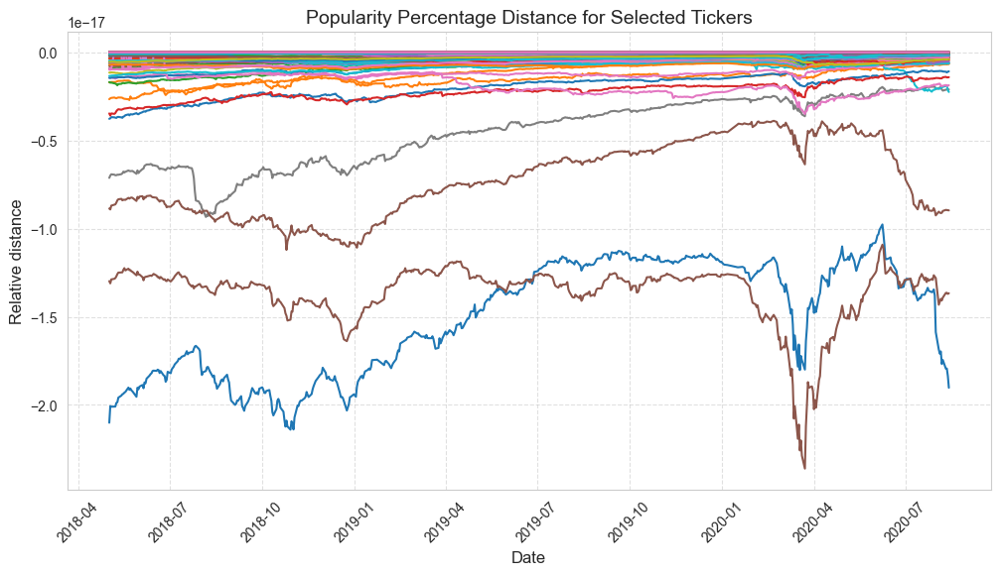

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get unique tickers from df_top_n
tickers = df_top_n["ticker"].unique()

# Set plot style
sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))  # Adjust figure size

df_covid =  df_rank[["ticker", "date", "popularity_pct_distance"]]
#df_covid =  df_covid[df_covid["date"]>"2020-02-01"]

# Loop through each ticker and plot its popularity over time
for ticker in tickers:
    data = df_covid[df_covid["ticker"] == ticker][["date", "popularity_pct_distance"]]
    
    # Sort by date to ensure proper plotting
    data = data.sort_values("date")

    # Plot the line
    sns.lineplot(x="date", y="popularity_pct_distance", data=data) #label=ticker

# Formatting
plt.xlabel('Date', fontsize=12)
plt.ylabel('Relative distance', fontsize=12)
plt.title('Popularity Percentage Distance for Selected Tickers', fontsize=14)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid
plt.legend


In [23]:
df_rank

,date,ticker,mc,popularity,holders,prc_adj,shrcd,vol,rank_mkt,rank_popularity,rank_distance,m_daily,popularity_daily,m_daily_pct,popularity_daily_pct,popularity_pct_distance
6332,2018-05-02,AAPL,8.678660e+11,0.027558,150785.0,176.57001,11.0,66541423.0,1.0,1.0,0.000000,3.373960e+13,3.373960e+13,2.572247e-02,8.167874e-16,-2.100979e-17
1390680,2018-05-02,GE,1.231322e+11,0.024625,134735.0,14.18000,11.0,51678009.0,40.0,2.0,19.000000,3.373960e+13,3.373960e+13,3.649486e-03,7.298461e-16,-2.663563e-18
1135660,2018-05-02,F,4.387708e+10,0.023955,131071.0,11.21000,11.0,41899467.0,147.0,3.0,48.000000,3.373960e+13,3.373960e+13,1.300462e-03,7.099986e-16,-9.233266e-19
135067,2018-05-02,AMD,1.063370e+10,0.023433,128212.0,10.97000,11.0,29089898.0,571.0,4.0,141.750000,3.373960e+13,3.373960e+13,3.151698e-04,6.945117e-16,-2.188891e-19
1466512,2018-05-02,GPRO,5.574253e+08,0.020854,114106.0,4.97000,11.0,2494409.0,2987.0,5.0,596.400000,3.373960e+13,3.373960e+13,1.652140e-05,6.181009e-16,-1.021189e-20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3533378,2020-08-13,VHI,3.005101e+08,0.000000,0.0,10.63000,11.0,7384.0,3880.0,7092.5,-0.452943,4.315688e+13,4.315688e+13,6.963203e-06,0.000000e+00,-0.000000e+00
3542878,2020-08-13,VISL,3.607296e+07,0.000000,0.0,2.24000,11.0,866327.0,6053.0,7092.5,-0.146563,4.315688e+13,4.315688e+13,8.358565e-07,0.000000e+00,-0.000000e+00
3574327,2020-08-13,VRAY,4.852596e+08,0.000000,0.0,3.28000,11.0,612505.0,3301.0,7092.5,-0.534579,4.315688e+13,4.315688e+13,1.124408e-05,0.000000e+00,-0.000000e+00
3699450,2020-08-13,XES,1.123150e+08,0.000000,0.0,38.53000,73.0,98610.0,5059.0,7092.5,-0.286711,4.315688e+13,4.315688e+13,2.602481e-06,0.000000e+00,-0.000000e+00


In [25]:
df_grouped = df_rank[["date", "rank_distance"]].groupby("date").sum()


In [26]:
df_grouped

,rank_distance
date,
2018-05-02,6453.989620
2018-05-03,6475.209760
2018-05-04,6447.831001
2018-05-07,6512.987460
2018-05-08,6427.303891
...,...
2020-08-07,8562.429120
2020-08-10,8578.629019
2020-08-11,8630.404205


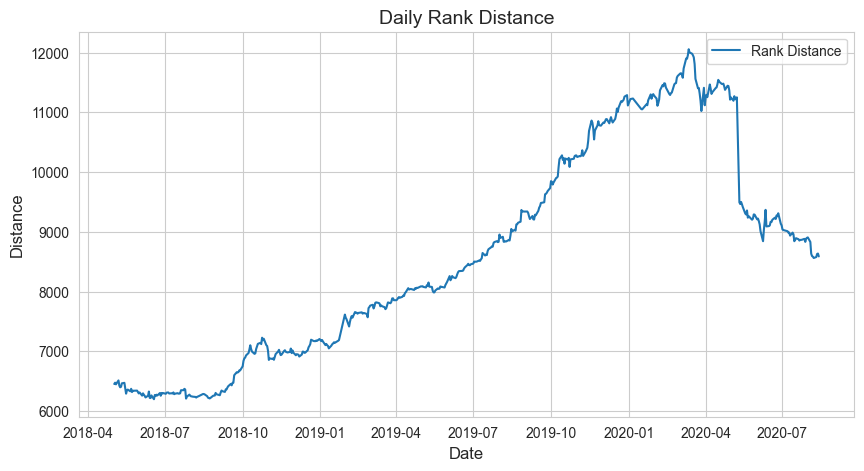

In [27]:
sns.set_style("whitegrid")

plt.figure(figsize=(10, 5))  # Set figure size
sns.lineplot(x=df_grouped.index, y='rank_distance', data=df_grouped, label="Rank Distance")
#sns.lineplot(x=df_grouped.index, y='pct_distance', data=df_grouped, label="Pct Data")

# Formatting
plt.xlabel('Date', fontsize=12)
plt.ylabel('Distance', fontsize=12)
plt.title('Daily Rank Distance', fontsize=14)
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.legend()

# Show the plot
plt.show()

In [28]:
sns.set_style("whitegrid")

plt.figure(figsize=(10, 5))  # Set figure size
sns.lineplot(x=df_grouped.index, y='pct_distance', data=df_grouped, label="Percentage Distance")

# Formatting
plt.xlabel('Date', fontsize=12)
plt.ylabel('Distance', fontsize=12)
plt.title('Daily Market Cap Percentage Distance', fontsize=14)
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.legend()

# Show the plot
plt.show()

ValueError: Could not interpret value `pct_distance` for `y`. An entry with this name does not appear in `data`.

<Figure size 1000x500 with 0 Axes>

In [33]:
df_top_n, df_rank = dl.compute_distances(n=100, by="holders")
df_top_n


,date,ticker,mc,popularity,mc_retail,holders,prc_adj,shrcd,vol,rank_mkt,...,rank_holders,rank_distance,m_daily,mc_retail_daily,holders_daily,m_daily_pct,mc_retail_daily_pct,holders_daily_pct,pct_distance,holders_pct_distance
0,2018-05-02,AAPL,8.678660e+11,0.028776,2.662411e+07,150785.00,176.57001,11.0,66541423.0,1.0,...,1.0,-0.666667,3.275213e+13,5.006985e+08,3.275213e+13,0.026498,0.053174,4.603823e-09,1.418464e-03,-1.219921e-10
1,2018-05-02,GE,1.231322e+11,0.025713,1.910542e+06,134735.00,14.18000,11.0,51678009.0,40.0,...,2.0,0.481481,3.275213e+13,5.006985e+08,3.275213e+13,0.003760,0.003816,4.113779e-09,2.145829e-07,-1.546581e-11
2,2018-05-02,F,4.387708e+10,0.025014,1.469306e+06,131071.00,11.21000,11.0,41899467.0,144.0,...,3.0,2.789474,3.275213e+13,5.006985e+08,3.275213e+13,0.001340,0.002935,4.001908e-09,4.680080e-06,-5.361225e-12
3,2018-05-02,AMD,1.063370e+10,0.024468,1.406486e+06,128212.00,10.97000,11.0,29089898.0,559.0,...,4.0,12.634146,3.275213e+13,5.006985e+08,3.275213e+13,0.000325,0.002809,3.914616e-09,6.978725e-06,-1.270952e-12
4,2018-05-02,GPRO,5.574253e+08,0.021776,5.671068e+05,114106.00,4.97000,11.0,2494409.0,2813.0,...,5.0,32.891566,3.275213e+13,5.006985e+08,3.275213e+13,0.000017,0.001133,3.483926e-09,1.263577e-06,-5.928259e-14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56395,2020-08-13,GLUU,1.329236e+09,0.001707,4.341376e+05,55801.75,7.78000,11.0,11110950.0,1995.0,...,96.0,4.063452,4.091712e+13,4.689189e+09,4.091712e+13,0.000032,0.000093,1.363775e-09,5.563904e-09,-4.430184e-14
56396,2020-08-13,ZOM,7.924917e+07,0.001703,7.822401e+03,55675.45,0.14050,12.0,51483543.0,4304.0,...,97.0,0.555475,4.091712e+13,4.689189e+09,4.091712e+13,0.000002,0.000002,1.360689e-09,-4.481460e-13,-2.633560e-15
56397,2020-08-13,ALK,4.672318e+09,0.001701,2.101058e+06,55598.25,37.79000,11.0,1802726.0,1016.0,...,98.0,5.864865,4.091712e+13,4.689189e+09,4.091712e+13,0.000114,0.000448,1.358802e-09,1.495972e-07,-1.551595e-13
56398,2020-08-13,COTY,3.136320e+09,0.001699,2.281654e+05,55514.70,4.11000,11.0,4151298.0,1297.0,...,99.0,1.243945,4.091712e+13,4.689189e+09,4.091712e+13,0.000077,0.000049,1.356760e-09,-1.362068e-09,-1.039946e-13


In [34]:
df_rank

,date,ticker,mc,popularity,mc_retail,holders,prc_adj,shrcd,vol,rank_mkt,...,rank_holders,rank_distance,m_daily,mc_retail_daily,holders_daily,m_daily_pct,mc_retail_daily_pct,holders_daily_pct,pct_distance,holders_pct_distance
4149,2018-05-02,AAPL,8.678660e+11,2.877597e-02,2.662411e+07,150785.0,176.57001,11.0,66541423.0,1.0,...,1.0,-0.666667,3.275213e+13,5.006985e+08,3.275213e+13,2.649800e-02,5.317393e-02,4.603823e-09,1.418464e-03,-1.219921e-10
1098468,2018-05-02,GE,1.231322e+11,2.571298e-02,1.910542e+06,134735.0,14.18000,11.0,51678009.0,40.0,...,2.0,0.481481,3.275213e+13,5.006985e+08,3.275213e+13,3.759518e-03,3.815754e-03,4.113779e-09,2.145829e-07,-1.546581e-11
899912,2018-05-02,F,4.387708e+10,2.501373e-02,1.469306e+06,131071.0,11.21000,11.0,41899467.0,144.0,...,3.0,2.789474,3.275213e+13,5.006985e+08,3.275213e+13,1.339671e-03,2.934512e-03,4.001908e-09,4.680080e-06,-5.361225e-12
106013,2018-05-02,AMD,1.063370e+10,2.446812e-02,1.406486e+06,128212.0,10.97000,11.0,29089898.0,559.0,...,4.0,12.634146,3.275213e+13,5.006985e+08,3.275213e+13,3.246722e-04,2.809047e-03,3.914616e-09,6.978725e-06,-1.270952e-12
1157438,2018-05-02,GPRO,5.574253e+08,2.177611e-02,5.671068e+05,114106.0,4.97000,11.0,2494409.0,2813.0,...,5.0,32.891566,3.275213e+13,5.006985e+08,3.275213e+13,1.701951e-05,1.132631e-03,3.483926e-09,1.263577e-06,-5.928259e-14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
765018,2020-08-13,EFU,2.356688e+06,6.119361e-08,3.440420e+01,2.0,17.20210,73.0,157.0,5158.0,...,5171.5,-0.002514,4.091712e+13,4.689189e+09,4.091712e+13,5.759662e-08,7.336920e-09,4.887930e-14,-3.687514e-16,-2.815280e-21
2208695,2020-08-13,RFEU,2.067975e+07,6.119361e-08,1.181700e+02,2.0,59.08500,73.0,34.0,4885.0,...,5171.5,-0.051825,4.091712e+13,4.689189e+09,4.091712e+13,5.054058e-07,2.520052e-08,4.887930e-14,-1.210142e-14,-2.470388e-20
2671938,2020-08-13,UPV,4.402640e+06,6.119361e-08,8.805280e+01,2.0,44.02640,73.0,93.0,5134.0,...,5171.5,-0.006387,4.091712e+13,4.689189e+09,4.091712e+13,1.075990e-07,1.877783e-08,4.887930e-14,-1.667869e-15,-5.259360e-21
1099595,2020-08-13,GEC,6.765450e+07,0.000000e+00,0.000000e+00,0.0,2.65000,11.0,3383.0,4384.0,...,5174.5,-0.152441,4.091712e+13,4.689189e+09,4.091712e+13,1.653452e-06,0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00


## Trading Volume

In [ ]:
df_vol = df_merged[["date", "vol", "daily_change_holders", "daily_holders"]]
df_vol["abs_change"] = df_vol["daily_change_holders"]
df_vol = df_vol[["date", "daily_change_holders", "daily_holders", "vol", "abs_change"]].groupby("date").sum()
df_vol["relative_volatility"] = df_vol["abs_change"] / df_vol["daily_holders"]

In [ ]:
df_merged[df_merged["ticker"]=="AMZN"][["daily_change_holders", "vol"]]

,daily_change_holders,vol
121426,NaN,4360073.0
121427,318.210526,4251517.0
121428,-333.210526,3443067.0
121429,-535.300000,3801755.0
121430,-635.700000,3069149.0
...,...,...
121985,1748.000000,3925635.0
121986,3771.041667,3165604.0
121987,2865.583333,3705374.0
121988,1260.589912,3517918.0


# Comparing Returns and Risk Measures
## Retail Performance Under Different Samples

In [1]:
%load_ext autoreload
%autoreload 2

#### Main Problems
**Facts**
> In December 12, 2019, Robinhood introduced fractional share trading on its platform
- I don't know how many stocks each position holds, BUT i know that fractional investments are possible.
    - I can assume that the amount of money invested in each stock is normally distributed and i.i.d. for each stock
    - However, I will never know if someone has sold 99.9% of their position in a certain stock 
- The number of total active users incresed significantly after the early-2020 covid crash

In [ ]:
from src import Analyzer
from src.utils.params import ReturnParams

return_params = ReturnParams(
    horizons={5, 30, 120},  
    start_date=None,
    cumulative=True,
    append_start=False
)

an_fedyk = Analyzer(compare_tickers=[], return_params=return_params, stocks_only=True, weights_application="wealth", dl_kwargs={"weights_method":"dollar"})
an_mine = Analyzer(compare_tickers=[], return_params=return_params, stocks_only=True, weights_application="number", dl_kwargs={"weights_method":"dollar"})

an_compare = Analyzer(compare_tickers=["VT", "VOO"], exclude_rh=True, return_params=return_params, stocks_only=False, weights_application="wealth")

r_fedyk, h_fedyk = an_fedyk.build_returns()
r_mine, h_mine = an_mine.build_returns()
r_compare, h_compare = an_compare.build_returns()



ModuleNotFoundError: No module named 'src.analyzer'

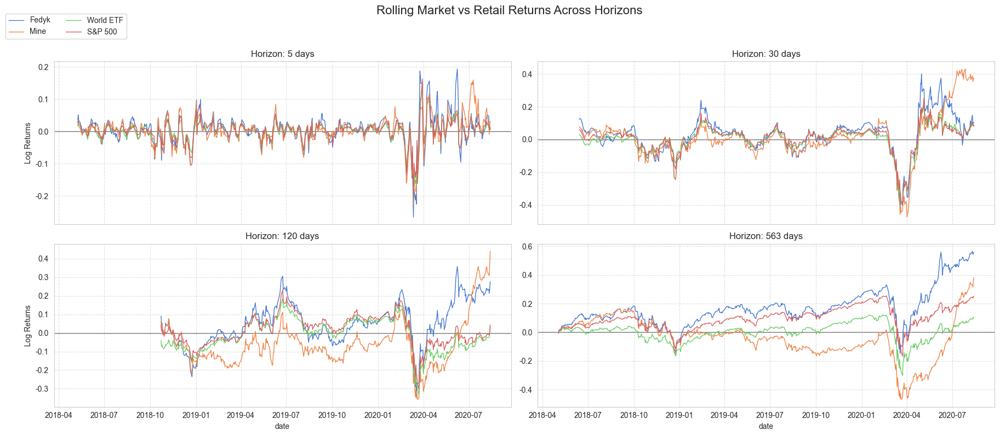

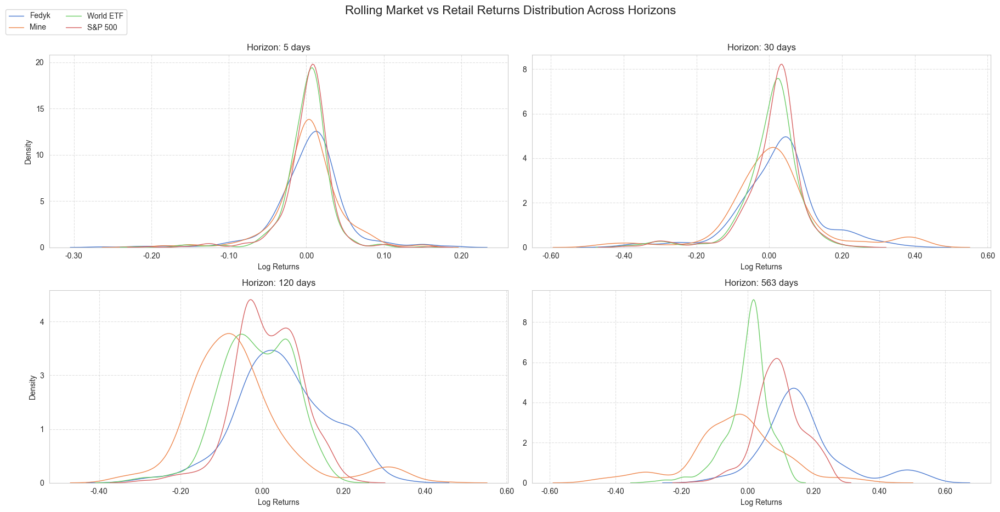

In [ ]:
from src.visuals.plotter import Plotter, ReturnSeries

plotter = Plotter([
    ReturnSeries(label="Fedyk", df=r_fedyk, horizons=h_fedyk),
    ReturnSeries(label="Mine", df=r_mine, horizons=h_mine),
    ReturnSeries(label="", df=r_compare, horizons=h_compare)
])

plotter.plot_returns_timeseries(custom_labels=["Fedyk", "Mine", "World ETF", "S&P 500"])
plotter.plot_returns_kdes(custom_labels=["Fedyk", "Mine", "World ETF", "S&P 500"])
#plotter.plot_returns_cdfs(custom_labels=["Fedyk", "Mine", "World ETF", "S&P 500"])

In [95]:
from src import Analyzer
from src.utils.params import ReturnParams

return_params = ReturnParams(
    horizons={5, 30, 120},  
    start_date=None,
    cumulative=True,
    append_start=False
)

an_fedyk = Analyzer(compare_tickers=[], return_params=return_params, stocks_only=False, weights_application="wealth", dl_kwargs={"weights_method":"dollar"})
an_mine = Analyzer(compare_tickers=[], return_params=return_params, stocks_only=False, weights_application="number", dl_kwargs={"weights_method":"dollar"})

an_compare = Analyzer(compare_tickers=["VT", "VOO"], exclude_rh=True, return_params=return_params, stocks_only=False, weights_application="wealth")

r_fedyk, h_fedyk = an_fedyk.build_returns()
r_mine, h_mine = an_mine.build_returns()
r_compare, h_compare = an_compare.build_returns()



2025-04-28 15:16:42,891 - src.analyzer - INFO - ############################## Analysis Started ############################## (analyzer.py:83)
2025-04-28 15:16:47,903 - src.analyzer - INFO - ############################## Analysis Started ############################## (analyzer.py:83)
2025-04-28 15:16:50,756 - src.analyzer - INFO - ############################## Analysis Started ############################## (analyzer.py:83)
2025-04-28 15:16:52,464 - src.analyzer - WARNING - Empty dataframe produced for tickers: [] (analyzer.py:175)
2025-04-28 15:16:52,695 - src.analyzer - WARNING - Empty dataframe produced for tickers: [] (analyzer.py:175)


In [44]:
np.exp(r_mine)

,rh_portfolio,rh_portfolio_5_return,rh_portfolio_30_return,rh_portfolio_120_return,rh_portfolio_563_return
date,,,,,
2018-05-03,1.000000,NaN,NaN,NaN,1.000000
2018-05-04,1.016154,NaN,NaN,NaN,1.016154
2018-05-07,1.006721,NaN,NaN,NaN,1.022984
2018-05-08,0.987219,NaN,NaN,NaN,1.009909
2018-05-09,1.011629,1.021653,NaN,NaN,1.021653
...,...,...,...,...,...
2020-08-07,0.985494,1.048489,1.411960,1.359058,1.237672
2020-08-10,0.999199,1.024709,1.447712,1.340037,1.236681
2020-08-11,0.980538,0.988740,1.390789,1.327287,1.212612


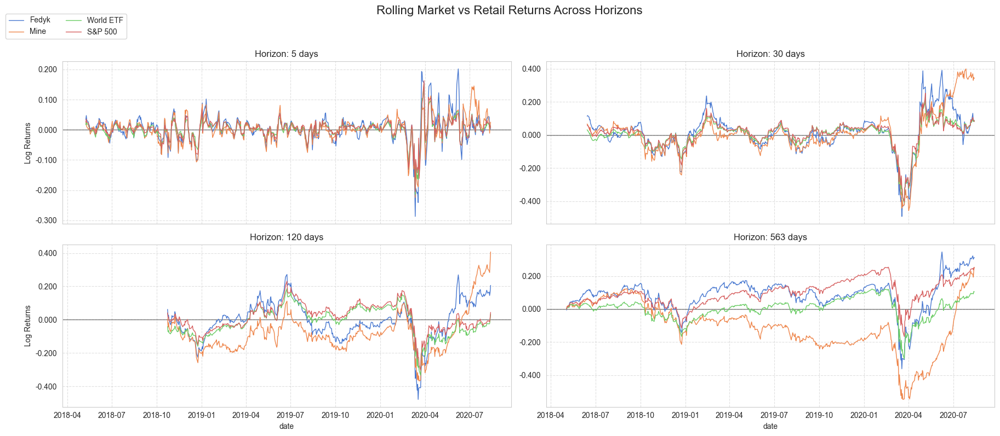

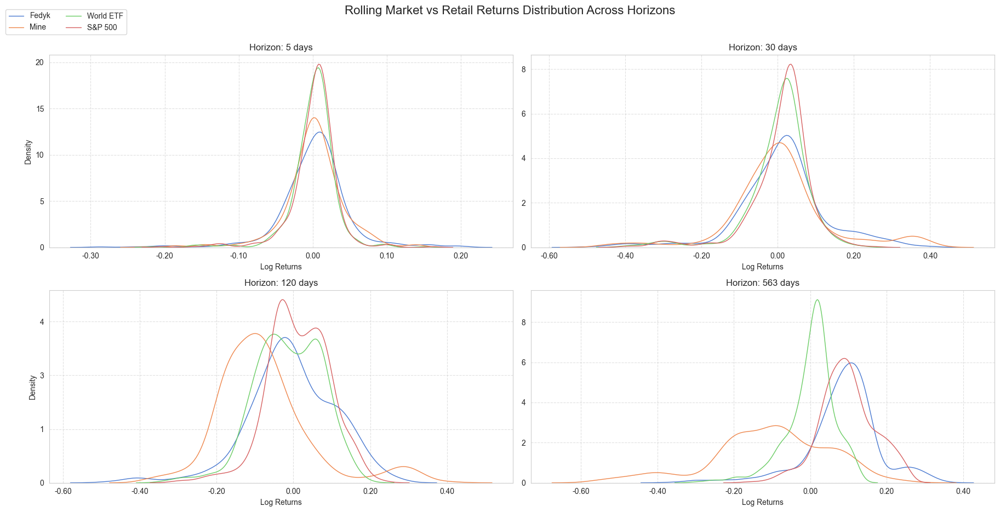

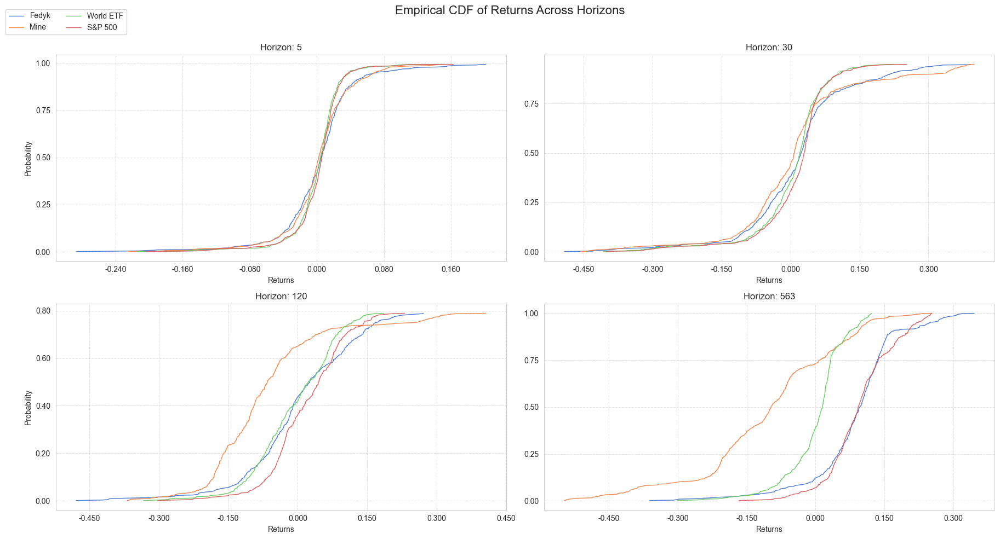

In [96]:
from src.visuals.plotter import Plotter, ReturnSeries

plotter = Plotter([
    ReturnSeries(label="Fedyk", df=r_fedyk, horizons=h_fedyk),
    ReturnSeries(label="Mine", df=r_mine, horizons=h_mine),
    ReturnSeries(label="", df=r_compare, horizons=h_compare)
])

plotter.plot_returns_timeseries(custom_labels=["Fedyk", "Mine", "World ETF", "S&P 500"])
plotter.plot_returns_kdes(custom_labels=["Fedyk", "Mine", "World ETF", "S&P 500"])
plotter.plot_returns_cdfs(custom_labels=["Fedyk", "Mine", "World ETF", "S&P 500"])

In [ ]:
from scipy import stats

for horizon in list(return_params.horizons):
    group1 = r_fedyk[f"rh_portfolio_{horizon}_return"].dropna()
    group2 = r_mine[f"rh_portfolio_{horizon}_return"].dropna()
    group3 = r_compare[f"VT_{horizon}_return"].dropna()
    group4 = r_compare[f"VOO_{horizon}_return"].dropna()


    # Run one-way ANOVA
    f_statistic, p_value = stats.f_oneway(group1, group2, group3, group4)

    print(f"Horizon: {horizon}")
    print(f"F = {f_statistic}, p = {p_value}")


Horizon: 120
F = 80.39217158930946, p = 1.7906843953262247e-18
Horizon: 563
F = 627.8396801503799, p = 1.9294450247029306e-110
Horizon: 5
F = 0.08790135879099685, p = 0.7669174564193729
Horizon: 30
F = 0.6621679461619114, p = 0.41597734031253164


In [71]:

desc_long = an_fedyk.build_returns()[0].describe()
desc_long.columns = [col.replace("rh_portfolio", "Fedyk").replace("_", " ") for col in desc_long.columns]
desc_long = desc_long.rename(columns={"Fedyk":"Fedyk daily returns"} )
desc_long = desc_long.T
desc_long["count"] = desc_long["count"].astype(int)
desc_long.round(6)   
desc_long

2025-04-26 08:32:06,162 - src.analyzer - WARNING - Empty dataframe produced for tickers: [] (analyzer.py:175)


,count,mean,std,min,25%,50%,75%,max
Fedyk daily returns,563,0.000555,0.020000,-0.125369,-0.006658,0.000754,0.008755,0.097995
Fedyk 5 return,559,0.002684,0.047496,-0.287100,-0.017592,0.005106,0.022556,0.201768
Fedyk 30 return,534,0.012231,0.118341,-0.491574,-0.044795,0.018809,0.055543,0.391200
Fedyk 120 return,444,-0.004432,0.114878,-0.478685,-0.062876,-0.010586,0.076930,0.271451
Fedyk 563 return,563,0.086945,0.096844,-0.361597,0.050499,0.096675,0.134919,0.345822


In [ ]:
desc_long = an_compare.build_returns()[0].describe()
desc_long.columns = [col.replace("_", " ") for col in desc_long.columns]
desc_long = desc_long.T
desc_long = desc_long.rename(columns={"VT":"VT daily returns", "VOO":"VOO daily returns"} )
desc_long["count"] = desc_long["count"].astype(int)
desc_long.round(6)   
desc_long

In [80]:

desc_long = an_mine.build_returns()[0].describe()
desc_long.columns = [col.replace("rh_portfolio", "Mine").replace("_", " ") for col in desc_long.columns]
desc_long = desc_long.rename(columns={"Mine":"Mine daily returns"} )
desc_long = desc_long.T
desc_long["count"] = desc_long["count"].astype(int)
desc_long.round(6)   


2025-04-26 08:41:25,455 - src.analyzer - WARNING - Empty dataframe produced for tickers: [] (analyzer.py:175)


,count,mean,std,min,25%,50%,75%,max
Mine daily returns,563,0.000450,0.018710,-0.126475,-0.006472,0.000606,0.009044,0.072808
Mine 5 return,559,0.001891,0.041707,-0.224346,-0.015152,0.002165,0.020423,0.145245
Mine 30 return,534,0.005924,0.134409,-0.456420,-0.056865,0.006054,0.044482,0.399350
Mine 120 return,444,-0.076568,0.124668,-0.368195,-0.159984,-0.095393,-0.037126,0.406700
Mine 563 return,563,-0.103880,0.152561,-0.547158,-0.193259,-0.096858,0.008830,0.253266


## ST Analysis

In [1]:
%load_ext autoreload
%autoreload 2

In [134]:
from src import Analyzer
from src.utils.params import ReturnParams
import numpy as np

return_params = ReturnParams(
    horizons={1},  
    start_date=None,
#    end_date="2020-02-03",
    cumulative=False,
    append_start=False
)

an_fedyk = Analyzer(compare_tickers=[], return_params=return_params, stocks_only=False, weights_application="wealth", dl_kwargs={"weights_method":"dollar"})
an_mine = Analyzer(compare_tickers=[], return_params=return_params, stocks_only=False, weights_application="number", dl_kwargs={"weights_method":"dollar"})

an_compare = Analyzer(compare_tickers=["VT", "VOO"], exclude_rh=True, return_params=return_params, stocks_only=False, weights_application="wealth")

r_fedyk, h_fedyk = an_fedyk.build_returns()
r_mine, h_mine = an_mine.build_returns()
r_compare, h_compare = an_compare.build_returns()



2025-04-28 15:38:41,580 - src.analyzer - INFO - ############################## Analysis Started ############################## (analyzer.py:83)
2025-04-28 15:38:49,208 - src.analyzer - INFO - ############################## Analysis Started ############################## (analyzer.py:83)
2025-04-28 15:38:53,727 - src.analyzer - INFO - ############################## Analysis Started ############################## (analyzer.py:83)
2025-04-28 15:38:57,534 - src.analyzer - WARNING - Empty dataframe produced for tickers: [] (analyzer.py:175)
2025-04-28 15:38:57,847 - src.analyzer - WARNING - Empty dataframe produced for tickers: [] (analyzer.py:175)


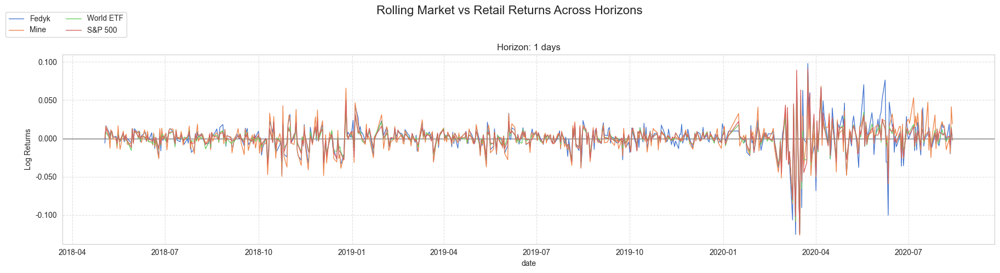

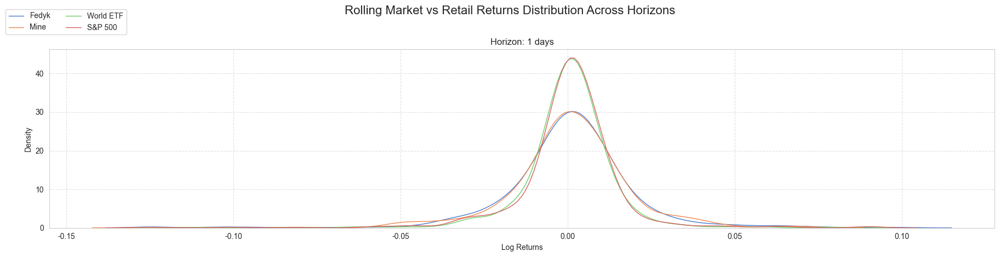

In [135]:
from src.visuals.plotter import Plotter, ReturnSeries



plotter = Plotter([
    ReturnSeries(label="Fedyk", df=r_fedyk, horizons=h_fedyk),
    ReturnSeries(label="Mine", df=r_mine, horizons=h_mine),
    ReturnSeries(label="", df=r_compare, horizons=h_compare)
])

plotter.plot_returns_timeseries(custom_labels=["Fedyk", "Mine", "World ETF", "S&P 500"])
plotter.plot_returns_kdes(custom_labels=["Fedyk", "Mine", "World ETF", "S&P 500"])
#plotter.plot_returns_cdfs(custom_labels=["Fedyk", "Mine", "World ETF", "S&P 500"])

In [136]:

ret_all = an_mine.build_returns()[0].merge(an_fedyk.build_returns()[0], right_index=True, left_index=True, suffixes=("_Mine", "_Fedyk"))
cols_to_keep = [col for col in ret_all.columns if "return" in col]
ret_all = ret_all[cols_to_keep]
desc_all = ret_all.describe().T
desc_all["count"] = desc_all["count"].astype(int)
desc_all["positive returns"] = ret_all.gt(0).sum() / desc_all["count"]
desc_all
desc_all.round(6)

2025-04-28 15:39:36,947 - src.analyzer - WARNING - Empty dataframe produced for tickers: [] (analyzer.py:175)
2025-04-28 15:39:37,403 - src.analyzer - WARNING - Empty dataframe produced for tickers: [] (analyzer.py:175)


,count,mean,std,min,25%,50%,75%,max,positive returns
rh_portfolio_1_return_Mine,563,0.000450,0.01871,-0.126475,-0.006472,0.000606,0.009044,0.072808,0.522202
rh_portfolio_1_return_Fedyk,563,0.000555,0.02000,-0.125369,-0.006658,0.000754,0.008755,0.097995,0.532860


In [137]:
from scipy import stats

group1 = r_fedyk["rh_portfolio"]
group2 = r_mine["rh_portfolio"]
group3 = r_compare["VOO"]
group4 = r_compare["VT"]


from itertools import combinations
from scipy import stats
import pandas as pd   # just to collect results neatly

# Put everything in a dict so we keep names with the data
groups = {
    "Fedyk": group1,
    "Mine": group2,
    "VOO": group3,
    "VT": group4,
}

results = []

# r = subset size (start at 2, go up to 4)
for r in range(2, len(groups) + 1):
    for combo in combinations(groups.items(), r):
        names, arrays = zip(*combo)          # unzip into two tuples
        f, p = stats.f_oneway(*arrays)       # *arrays expands to the k samples
        results.append({"subset": names, "F": f, "p": p})

# optional: inspect as a DataFrame, sorted by p-value
anova_table = pd.DataFrame(results).sort_values("p")
anova_table.round(6)


,subset,F,p
2,"(Fedyk, VT)",0.123106,0.725755
5,"(VOO, VT)",0.078475,0.779426
4,"(Mine, VT)",0.068498,0.793584
1,"(Fedyk, VOO)",0.010935,0.916736
0,"(Fedyk, Mine)",0.008335,0.927275
8,"(Fedyk, VOO, VT)",0.069435,0.932923
7,"(Fedyk, Mine, VT)",0.062966,0.938977
9,"(Mine, VOO, VT)",0.046579,0.954490
10,"(Fedyk, Mine, VOO, VT)",0.045550,0.987099
6,"(Fedyk, Mine, VOO)",0.006693,0.993330


In [138]:
from itertools import combinations
from scipy import stats
import pandas as pd   # just to collect results neatly

group1 = r_fedyk["rh_portfolio"]
group2 = r_mine["rh_portfolio"]
group3 = r_compare["VOO"]
group4 = r_compare["VT"]

# Put everything in a dict so we keep names with the data
groups = {
    "Fedyk": group1,
    "Mine": group2,
    "VOO": group3,
    "VT": group4,
}

results = []

# r = subset size (start at 2, go up to 4)
for r in range(2, len(groups) + 1):
    for combo in combinations(groups.items(), r):
        names, arrays = zip(*combo)          # unzip into two tuples
        f, p = stats.fligner(*arrays)       # *arrays expands to the k samples
        results.append({"subset": names, "F": f, "p": p})

# optional: inspect as a DataFrame, sorted by p-value
anova_table = pd.DataFrame(results).sort_values("p")
anova_table.round(6)

,subset,F,p
10,"(Fedyk, Mine, VOO, VT)",73.410013,0.000000
9,"(Mine, VOO, VT)",52.796594,0.000000
8,"(Fedyk, VOO, VT)",49.720452,0.000000
7,"(Fedyk, Mine, VT)",47.695216,0.000000
6,"(Fedyk, Mine, VOO)",46.156948,0.000000
4,"(Mine, VT)",38.480331,0.000000
3,"(Mine, VOO)",37.127424,0.000000
2,"(Fedyk, VT)",36.387775,0.000000
1,"(Fedyk, VOO)",34.874042,0.000000
0,"(Fedyk, Mine)",0.031996,0.858037


### Excluding COVID

In [151]:
from src import Analyzer
from src.utils.params import ReturnParams
import numpy as np

return_params = ReturnParams(
    horizons={1},  
    start_date=None,
    end_date="2020-02-03",
    cumulative=True,
    append_start=False
)

an_fedyk = Analyzer(compare_tickers=[], return_params=return_params, stocks_only=False, weights_application="wealth", dl_kwargs={"weights_method":"dollar"})
an_mine = Analyzer(compare_tickers=[], return_params=return_params, stocks_only=False, weights_application="number", dl_kwargs={"weights_method":"dollar"})

an_compare = Analyzer(compare_tickers=["VT", "VOO"], exclude_rh=True, return_params=return_params, stocks_only=False, weights_application="wealth")

r_fedyk, h_fedyk = an_fedyk.build_returns()
r_mine, h_mine = an_mine.build_returns()
r_compare, h_compare = an_compare.build_returns()

r_fedyk = np.exp(r_fedyk) - 1
r_mine = np.exp(r_mine) - 1


2025-04-28 16:56:51,709 - src.analyzer - INFO - ############################## Analysis Started ############################## (analyzer.py:83)
2025-04-28 16:57:00,342 - src.analyzer - INFO - ############################## Analysis Started ############################## (analyzer.py:83)
2025-04-28 16:57:03,346 - src.analyzer - INFO - ############################## Analysis Started ############################## (analyzer.py:83)
2025-04-28 16:57:06,032 - src.analyzer - WARNING - Empty dataframe produced for tickers: [] (analyzer.py:175)
2025-04-28 16:57:06,296 - src.analyzer - WARNING - Empty dataframe produced for tickers: [] (analyzer.py:175)


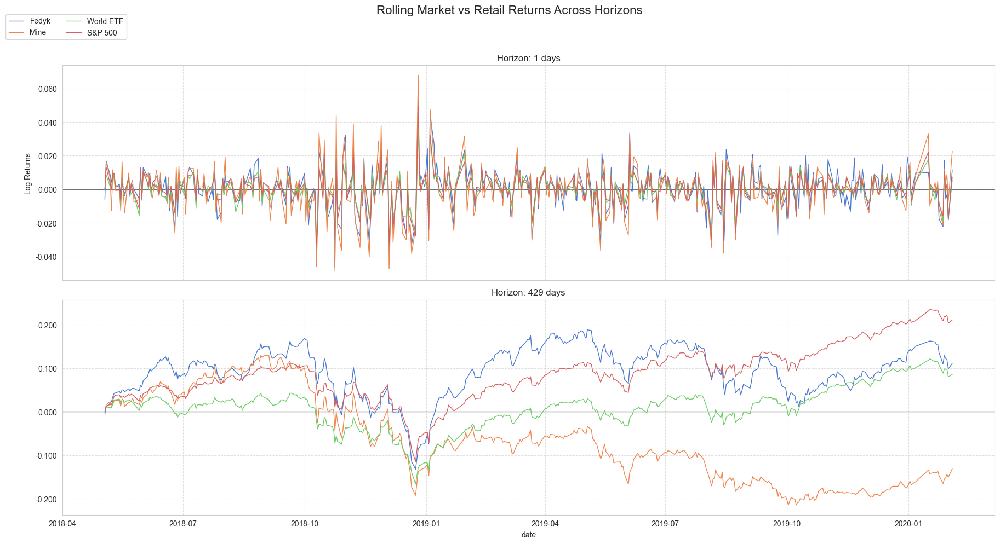

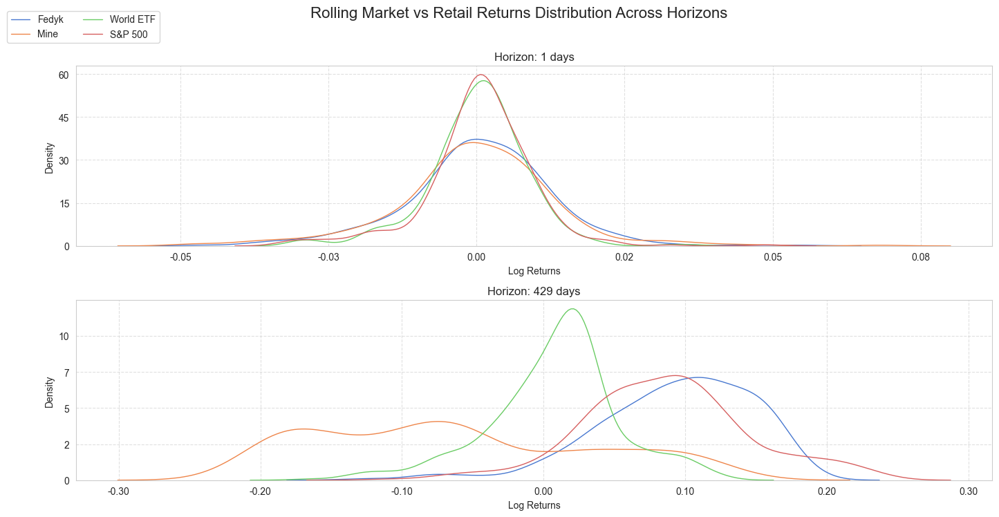

In [152]:
from src.visuals.plotter import Plotter, ReturnSeries



plotter = Plotter([
    ReturnSeries(label="Fedyk", df=r_fedyk, horizons=h_fedyk),
    ReturnSeries(label="Mine", df=r_mine, horizons=h_mine),
    ReturnSeries(label="", df=r_compare, horizons=h_compare)
])

plotter.plot_returns_timeseries(custom_labels=["Fedyk", "Mine", "World ETF", "S&P 500"])
plotter.plot_returns_kdes(custom_labels=["Fedyk", "Mine", "World ETF", "S&P 500"])
#plotter.plot_returns_cdfs(custom_labels=["Fedyk", "Mine", "World ETF", "S&P 500"])

In [143]:

ret_all = an_mine.build_returns()[0].merge(an_fedyk.build_returns()[0], right_index=True, left_index=True, suffixes=("_Mine", "_Fedyk"))
ret_all = ret_all.merge(an_compare.build_returns()[0], right_index=True, left_index=True)
cols_to_keep = [col for col in ret_all.columns if "return" in col]
ret_all = ret_all[cols_to_keep]
desc_all = ret_all.describe().T
desc_all["count"] = desc_all["count"].astype(int)
desc_all["positive returns"] = ret_all.gt(0).sum() / desc_all["count"]
desc_all
desc_all.round(6)

2025-04-28 15:52:27,532 - src.analyzer - WARNING - Empty dataframe produced for tickers: [] (analyzer.py:175)
2025-04-28 15:52:28,220 - src.analyzer - WARNING - Empty dataframe produced for tickers: [] (analyzer.py:175)


,count,mean,std,min,25%,50%,75%,max,positive returns
rh_portfolio_1_return_Mine,429,-0.000328,0.013581,-0.049700,-0.006121,-0.000106,0.007070,0.065745,0.489510
rh_portfolio_1_return_Fedyk,429,0.000246,0.012218,-0.047821,-0.005735,0.000549,0.007639,0.052644,0.522145
VT_1_return,429,0.000200,0.008370,-0.031068,-0.003812,0.000766,0.004879,0.036545,0.547786
VOO_1_return,429,0.000492,0.008938,-0.032828,-0.003072,0.000783,0.005103,0.049350,0.559441


In [161]:
diff = -0.000328 - 0.000246
diff*429

-0.24624600000000002

In [148]:
from itertools import combinations
from scipy import stats
import pandas as pd   # just to collect results neatly

group1 = r_fedyk["rh_portfolio"]
group2 = r_mine["rh_portfolio"]
group3 = r_compare["VOO"]
group4 = r_compare["VT"]

# Put everything in a dict so we keep names with the data
groups = {
    "Fedyk": group1,
    "Mine": group2,
    "VOO": group3,
    "VT": group4,
}

results = []

# r = subset size (start at 2, go up to 4)
for r in range(2, len(groups) + 1):
    for combo in combinations(groups.items(), r):
        names, arrays = zip(*combo)          # unzip into two tuples
        f, p = stats.f_oneway(*arrays)       # *arrays expands to the k samples
        results.append({"subset": names, "F": f, "p": p})

# optional: inspect as a DataFrame, sorted by p-value
anova_table = pd.DataFrame(results).sort_values("p")
anova_table.round(6)

,subset,F,p
3,"(Mine, VOO)",0.861444,0.353597
0,"(Fedyk, Mine)",0.398907,0.527823
4,"(Mine, VT)",0.321035,0.571135
9,"(Mine, VOO, VT)",0.517251,0.596281
5,"(VOO, VT)",0.243873,0.621550
6,"(Fedyk, Mine, VOO)",0.451564,0.636733
7,"(Fedyk, Mine, VT)",0.273712,0.760596
10,"(Fedyk, Mine, VOO, VT)",0.343216,0.794081
1,"(Fedyk, VOO)",0.055235,0.814249
2,"(Fedyk, VT)",0.028370,0.866282


In [150]:
from itertools import combinations
from scipy import stats
import pandas as pd   # just to collect results neatly

group1 = r_fedyk["rh_portfolio"]
group2 = r_mine["rh_portfolio"]
group3 = r_compare["VOO"]
group4 = r_compare["VT"]

# Put everything in a dict so we keep names with the data
groups = {
    "Fedyk": group1,
    "Mine": group2,
    "VOO": group3,
    "VT": group4,
}

results = []

# r = subset size (start at 2, go up to 4)
for r in range(2, len(groups) + 1):
    for combo in combinations(groups.items(), r):
        names, arrays = zip(*combo)          # unzip into two tuples
        f, p = stats.fligner(*arrays)       # *arrays expands to the k samples
        results.append({"subset": names, "F": f, "p": p})

# optional: inspect as a DataFrame, sorted by p-value
anova_table = pd.DataFrame(results).sort_values("p")
anova_table.round(6)

,subset,F,p
10,"(Fedyk, Mine, VOO, VT)",83.536860,0.000000
9,"(Mine, VOO, VT)",64.187897,0.000000
8,"(Fedyk, VOO, VT)",54.358126,0.000000
7,"(Fedyk, Mine, VT)",53.377374,0.000000
6,"(Fedyk, Mine, VOO)",51.856316,0.000000
4,"(Mine, VT)",45.431002,0.000000
3,"(Mine, VOO)",43.773368,0.000000
2,"(Fedyk, VT)",39.157744,0.000000
1,"(Fedyk, VOO)",37.465317,0.000000
0,"(Fedyk, Mine)",0.576961,0.447506
